# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [114]:
# Rui: When doing interactive computing it is common to need to access the underlying shell. This is doable through the use of the exclamation mark ! (or bang).

!mkdir data
!mkdir checkpoints

mkdir: cannot create directory ‘data’: File exists
mkdir: cannot create directory ‘checkpoints’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

In [5]:
testset

{'X': array([[[[ 38, 129, 150, ..., 115,  96, 101],
          [103, 142, 160, ..., 132,  65,  75],
          [ 60, 153, 169, ..., 142,  47,  60]],
 
         [[ 39, 127, 150, ..., 116,  97, 100],
          [104, 143, 163, ..., 133,  65,  73],
          [ 61, 152, 170, ..., 143,  49,  60]],
 
         [[ 39, 125, 152, ..., 117,  97,  99],
          [104, 143, 168, ..., 134,  65,  71],
          [ 62, 151, 172, ..., 144,  50,  59]],
 
         ..., 
         [[ 41, 121, 153, ..., 114,  86,  95],
          [102, 133, 172, ..., 136,  61,  63],
          [ 61, 153, 180, ..., 141,  54,  52]],
 
         [[ 42, 123, 150, ..., 114,  87,  95],
          [103, 134, 171, ..., 136,  62,  63],
          [ 62, 156, 181, ..., 142,  55,  52]],
 
         [[ 39, 123, 147, ..., 115,  88,  96],
          [ 97, 135, 169, ..., 136,  63,  64],
          [ 57, 157, 180, ..., 143,  56,  51]]],
 
 
        [[[ 39, 134, 150, ..., 122,  96, 109],
          [104, 150, 160, ..., 139,  65,  84],
          [ 61, 160

In [6]:
trainset['X'].shape, testset['X'].shape

((32, 32, 3, 73257), (32, 32, 3, 26032))

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

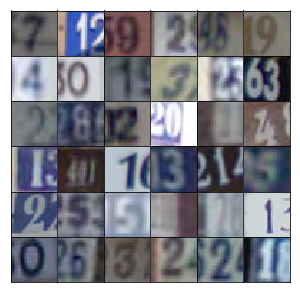

In [7]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [8]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [9]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        # Rui: move the 4th dimension batch_idx, to the 1th demension
        self.train_x = np.rollaxis(self.train_x, 3)  
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
            
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

# Reset Graph

In [97]:
tf.reset_default_graph()

## Network Inputs

Here, just creating some placeholders like normal.

In [98]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [99]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    # :param output_dim: The number of channels in the output image
            
    with tf.variable_scope('generator', reuse=reuse):        
        # First fully connected layer
        layer = tf.layers.dense(z, 4*4*512, activation=None, use_bias=False)
        # 4*4*512
        layer = tf.reshape(layer, (-1, 4, 4, 512))  # the 1th dimension should be -1
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)
        layer = tf.maximum(alpha * layer, layer)
        
        # Output layer, 32x32x3        
        # 8*8*256        
        # Rui: padding in transposed convolution https://discussions.udacity.com/t/padding-in-transposed-convolution/600424
        layer = tf.layers.conv2d_transpose(layer, filters=256, kernel_size=5, strides=2, activation=None, use_bias=False, padding='same')
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)        
        layer = tf.maximum(alpha * layer, layer)
        
        # 16*16*128
        layer = tf.layers.conv2d_transpose(layer, filters=128, kernel_size=5, strides=2, activation=None, use_bias=False, padding='same')
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)        
        layer = tf.maximum(alpha * layer, layer)

        # 32*32*3
        logits = tf.layers.conv2d_transpose(layer, filters=output_dim, kernel_size=5, strides=2, activation=None, use_bias=True, padding='same')
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [100]:
def discriminator(x, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3        
        # 16*16*64
        layer = tf.layers.conv2d(x, filters=64, kernel_size=5, strides=2, activation=None, use_bias=True, padding='same')
        layer = tf.maximum(alpha * layer, layer)        

        # 8*8*128
        layer = tf.layers.conv2d(layer, filters=128, kernel_size=5, strides=2, activation=None, use_bias=False, padding='same')
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)        
        layer = tf.maximum(alpha * layer, layer)

        # 4*4*256
        layer = tf.layers.conv2d(layer, filters=256, kernel_size=5, strides=2, activation=None, use_bias=False, padding='same')
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)        
        layer = tf.maximum(alpha * layer, layer)
        
        layer = tf.reshape(layer, (-1, 4*4*256))                
#         layer = tf.layers.flatten(layer)                
        logits = tf.layers.dense(layer, 1, activation=None, use_bias=True)
        out = tf.sigmoid(logits)
                
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [101]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [102]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [103]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [104]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [108]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1
#                 print('epoch', e, 'steps', steps)
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers                
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "steps", steps,
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    # Rui: use the same sample_z each time to see the images generated
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) (see Parameters 2) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time. You want the generator loss to be around 2 or 3.

In [106]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)

### Parameters 1

Epoch 1/1... steps 10 Discriminator Loss: 0.0331... Generator Loss: 4.9680
Epoch 1/1... steps 20 Discriminator Loss: 0.0515... Generator Loss: 3.5349
Epoch 1/1... steps 30 Discriminator Loss: 0.0609... Generator Loss: 5.9758
Epoch 1/1... steps 40 Discriminator Loss: 0.0424... Generator Loss: 5.2729
Epoch 1/1... steps 50 Discriminator Loss: 0.0344... Generator Loss: 6.2648
Epoch 1/1... steps 60 Discriminator Loss: 0.0199... Generator Loss: 5.5887
Epoch 1/1... steps 70 Discriminator Loss: 0.0061... Generator Loss: 6.2558
Epoch 1/1... steps 80 Discriminator Loss: 0.2534... Generator Loss: 12.9550
Epoch 1/1... steps 90 Discriminator Loss: 0.3103... Generator Loss: 10.4458
Epoch 1/1... steps 100 Discriminator Loss: 0.0235... Generator Loss: 5.7096


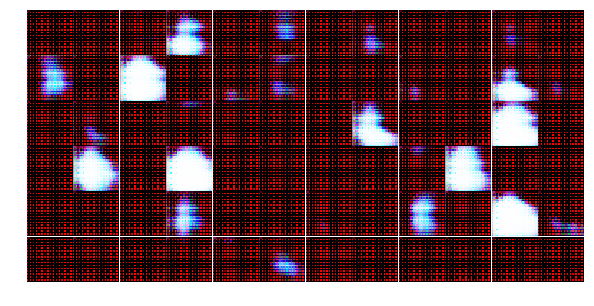

Epoch 1/1... steps 110 Discriminator Loss: 0.0363... Generator Loss: 5.0392
Epoch 1/1... steps 120 Discriminator Loss: 0.0736... Generator Loss: 4.3122
Epoch 1/1... steps 130 Discriminator Loss: 0.0221... Generator Loss: 6.4534
Epoch 1/1... steps 140 Discriminator Loss: 0.0100... Generator Loss: 5.9199
Epoch 1/1... steps 150 Discriminator Loss: 0.0019... Generator Loss: 7.2204
Epoch 1/1... steps 160 Discriminator Loss: 0.0248... Generator Loss: 4.0101
Epoch 1/1... steps 170 Discriminator Loss: 0.0014... Generator Loss: 12.0356
Epoch 1/1... steps 180 Discriminator Loss: 0.0052... Generator Loss: 9.6562
Epoch 1/1... steps 190 Discriminator Loss: 0.0214... Generator Loss: 7.4628
Epoch 1/1... steps 200 Discriminator Loss: 0.0171... Generator Loss: 9.2981


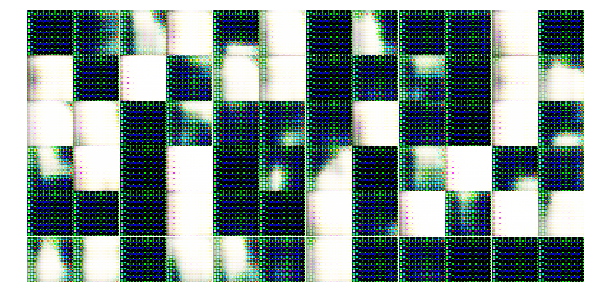

Epoch 1/1... steps 210 Discriminator Loss: 0.0103... Generator Loss: 5.2149
Epoch 1/1... steps 220 Discriminator Loss: 0.0012... Generator Loss: 8.2296
Epoch 1/1... steps 230 Discriminator Loss: 0.0031... Generator Loss: 6.9947
Epoch 1/1... steps 240 Discriminator Loss: 0.0061... Generator Loss: 8.3907
Epoch 1/1... steps 250 Discriminator Loss: 0.0022... Generator Loss: 10.3213
Epoch 1/1... steps 260 Discriminator Loss: 1.2482... Generator Loss: 5.3105
Epoch 1/1... steps 270 Discriminator Loss: 0.2391... Generator Loss: 3.8769
Epoch 1/1... steps 280 Discriminator Loss: 0.1627... Generator Loss: 4.7233
Epoch 1/1... steps 290 Discriminator Loss: 0.0822... Generator Loss: 3.6810
Epoch 1/1... steps 300 Discriminator Loss: 0.1013... Generator Loss: 3.5746


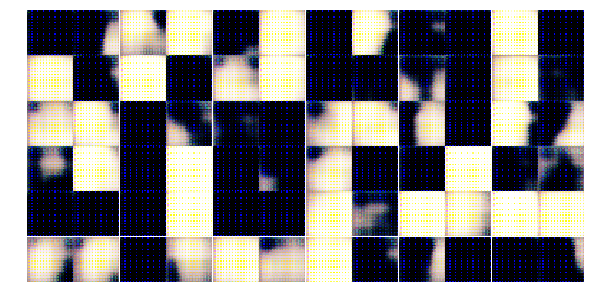

Epoch 1/1... steps 310 Discriminator Loss: 0.1324... Generator Loss: 3.1766
Epoch 1/1... steps 320 Discriminator Loss: 0.0141... Generator Loss: 6.8787
Epoch 1/1... steps 330 Discriminator Loss: 0.0214... Generator Loss: 4.9001
Epoch 1/1... steps 340 Discriminator Loss: 0.1407... Generator Loss: 3.4440
Epoch 1/1... steps 350 Discriminator Loss: 0.0369... Generator Loss: 4.7929
Epoch 1/1... steps 360 Discriminator Loss: 0.1842... Generator Loss: 2.7673
Epoch 1/1... steps 370 Discriminator Loss: 0.1124... Generator Loss: 3.2165
Epoch 1/1... steps 380 Discriminator Loss: 0.1662... Generator Loss: 5.0343
Epoch 1/1... steps 390 Discriminator Loss: 0.0273... Generator Loss: 4.8306
Epoch 1/1... steps 400 Discriminator Loss: 0.0319... Generator Loss: 7.5776


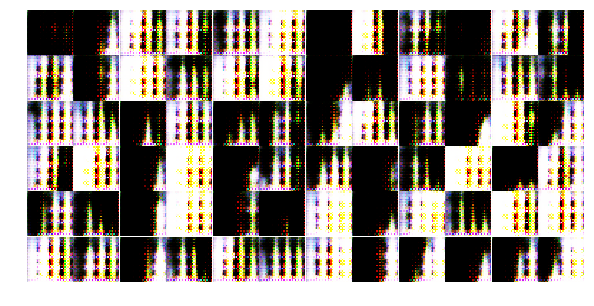

Epoch 1/1... steps 410 Discriminator Loss: 0.0165... Generator Loss: 6.6521
Epoch 1/1... steps 420 Discriminator Loss: 0.0039... Generator Loss: 8.2864
Epoch 1/1... steps 430 Discriminator Loss: 0.2719... Generator Loss: 12.2154
Epoch 1/1... steps 440 Discriminator Loss: 0.0337... Generator Loss: 4.9730
Epoch 1/1... steps 450 Discriminator Loss: 0.0636... Generator Loss: 4.7126
Epoch 1/1... steps 460 Discriminator Loss: 0.0134... Generator Loss: 5.8167
Epoch 1/1... steps 470 Discriminator Loss: 0.0150... Generator Loss: 6.1340
Epoch 1/1... steps 480 Discriminator Loss: 0.0266... Generator Loss: 5.3383
Epoch 1/1... steps 490 Discriminator Loss: 0.0454... Generator Loss: 5.1801
Epoch 1/1... steps 500 Discriminator Loss: 0.0250... Generator Loss: 5.6352


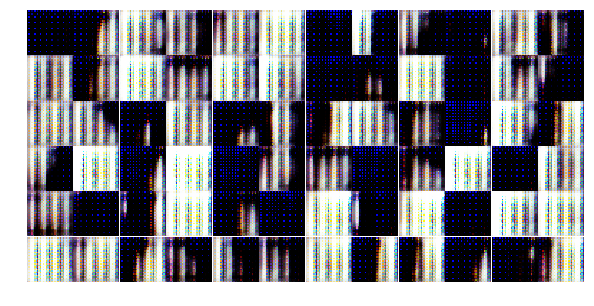

Epoch 1/1... steps 510 Discriminator Loss: 0.0119... Generator Loss: 5.9741
Epoch 1/1... steps 520 Discriminator Loss: 0.1937... Generator Loss: 4.2799
Epoch 1/1... steps 530 Discriminator Loss: 0.2966... Generator Loss: 3.1309
Epoch 1/1... steps 540 Discriminator Loss: 0.1082... Generator Loss: 2.9080
Epoch 1/1... steps 550 Discriminator Loss: 0.0128... Generator Loss: 8.1535
Epoch 1/1... steps 560 Discriminator Loss: 0.0278... Generator Loss: 5.6206
Epoch 1/1... steps 570 Discriminator Loss: 0.0233... Generator Loss: 4.6325
Epoch 1/1... steps 580 Discriminator Loss: 0.0265... Generator Loss: 5.3844
Epoch 1/1... steps 590 Discriminator Loss: 0.2860... Generator Loss: 7.5882
Epoch 1/1... steps 600 Discriminator Loss: 0.0173... Generator Loss: 6.2097


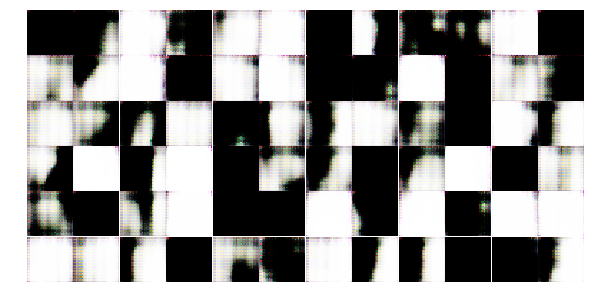

Epoch 1/1... steps 610 Discriminator Loss: 0.1102... Generator Loss: 2.9537
Epoch 1/1... steps 620 Discriminator Loss: 0.2930... Generator Loss: 4.6502
Epoch 1/1... steps 630 Discriminator Loss: 0.1595... Generator Loss: 4.8114
Epoch 1/1... steps 640 Discriminator Loss: 0.3832... Generator Loss: 5.4997
Epoch 1/1... steps 650 Discriminator Loss: 0.2967... Generator Loss: 4.0596
Epoch 1/1... steps 660 Discriminator Loss: 0.0594... Generator Loss: 7.0903
Epoch 1/1... steps 670 Discriminator Loss: 0.2000... Generator Loss: 3.4043
Epoch 1/1... steps 680 Discriminator Loss: 0.0328... Generator Loss: 4.7925
Epoch 1/1... steps 690 Discriminator Loss: 0.0289... Generator Loss: 4.9476
Epoch 1/1... steps 700 Discriminator Loss: 0.1003... Generator Loss: 3.5694


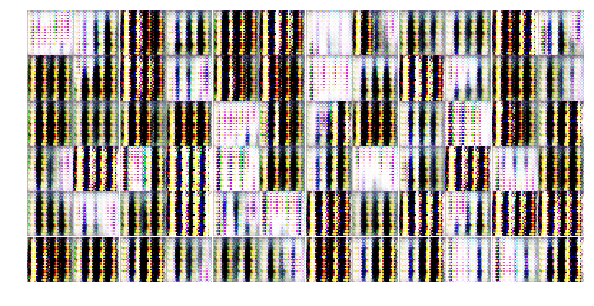

Epoch 1/1... steps 710 Discriminator Loss: 0.0260... Generator Loss: 5.8743
Epoch 1/1... steps 720 Discriminator Loss: 0.0248... Generator Loss: 4.5675
Epoch 1/1... steps 730 Discriminator Loss: 0.0292... Generator Loss: 4.5543
Epoch 1/1... steps 740 Discriminator Loss: 0.4583... Generator Loss: 10.1356
Epoch 1/1... steps 750 Discriminator Loss: 0.7733... Generator Loss: 1.0151
Epoch 1/1... steps 760 Discriminator Loss: 0.0531... Generator Loss: 4.0340
Epoch 1/1... steps 770 Discriminator Loss: 0.1020... Generator Loss: 14.6604
Epoch 1/1... steps 780 Discriminator Loss: 0.0621... Generator Loss: 8.0872
Epoch 1/1... steps 790 Discriminator Loss: 0.0822... Generator Loss: 5.0669
Epoch 1/1... steps 800 Discriminator Loss: 0.0624... Generator Loss: 9.2599


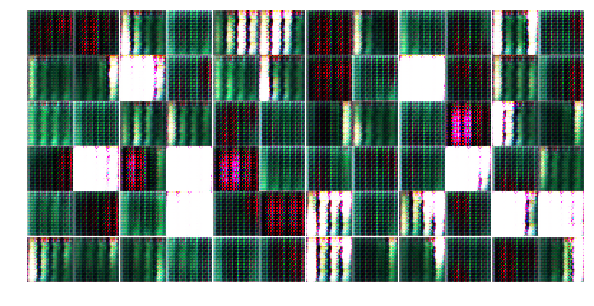

Epoch 1/1... steps 810 Discriminator Loss: 0.0239... Generator Loss: 4.2077
Epoch 1/1... steps 820 Discriminator Loss: 0.0225... Generator Loss: 6.1567
Epoch 1/1... steps 830 Discriminator Loss: 0.0051... Generator Loss: 6.1860
Epoch 1/1... steps 840 Discriminator Loss: 0.0010... Generator Loss: 8.4377
Epoch 1/1... steps 850 Discriminator Loss: 0.0126... Generator Loss: 5.8744
Epoch 1/1... steps 860 Discriminator Loss: 0.1166... Generator Loss: 5.0512
Epoch 1/1... steps 870 Discriminator Loss: 0.0414... Generator Loss: 5.3867
Epoch 1/1... steps 880 Discriminator Loss: 0.0095... Generator Loss: 5.8726
Epoch 1/1... steps 890 Discriminator Loss: 0.2855... Generator Loss: 12.0566
Epoch 1/1... steps 900 Discriminator Loss: 0.0868... Generator Loss: 2.7837


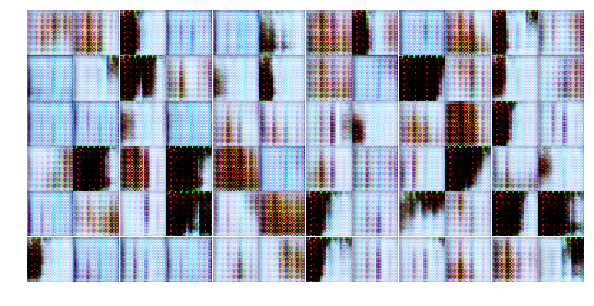

Epoch 1/1... steps 910 Discriminator Loss: 0.0543... Generator Loss: 4.7512
Epoch 1/1... steps 920 Discriminator Loss: 0.1534... Generator Loss: 5.4779
Epoch 1/1... steps 930 Discriminator Loss: 0.1716... Generator Loss: 6.0519
Epoch 1/1... steps 940 Discriminator Loss: 0.0081... Generator Loss: 5.5512
Epoch 1/1... steps 950 Discriminator Loss: 0.0162... Generator Loss: 6.5936
Epoch 1/1... steps 960 Discriminator Loss: 0.0291... Generator Loss: 4.9398
Epoch 1/1... steps 970 Discriminator Loss: 0.0086... Generator Loss: 5.5648
Epoch 1/1... steps 980 Discriminator Loss: 0.0043... Generator Loss: 6.3315
Epoch 1/1... steps 990 Discriminator Loss: 0.0254... Generator Loss: 6.2783
Epoch 1/1... steps 1000 Discriminator Loss: 0.0130... Generator Loss: 4.9224


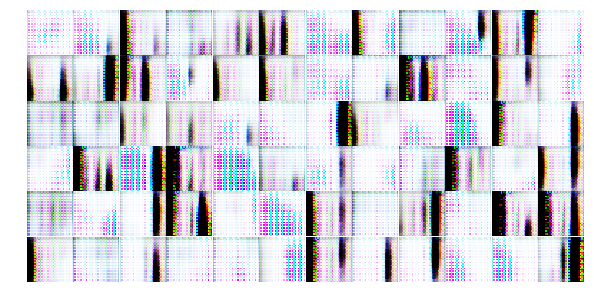

Epoch 1/1... steps 1010 Discriminator Loss: 0.0437... Generator Loss: 7.0227
Epoch 1/1... steps 1020 Discriminator Loss: 0.0163... Generator Loss: 5.8472
Epoch 1/1... steps 1030 Discriminator Loss: 0.0363... Generator Loss: 5.2522
Epoch 1/1... steps 1040 Discriminator Loss: 0.0021... Generator Loss: 10.7012
Epoch 1/1... steps 1050 Discriminator Loss: 0.0267... Generator Loss: 5.1814
Epoch 1/1... steps 1060 Discriminator Loss: 0.2052... Generator Loss: 3.5590
Epoch 1/1... steps 1070 Discriminator Loss: 0.0252... Generator Loss: 6.5484
Epoch 1/1... steps 1080 Discriminator Loss: 0.0917... Generator Loss: 4.5801
Epoch 1/1... steps 1090 Discriminator Loss: 0.0754... Generator Loss: 3.9835
Epoch 1/1... steps 1100 Discriminator Loss: 0.3477... Generator Loss: 13.3779


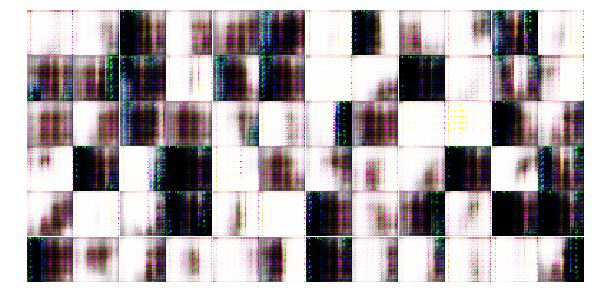

Epoch 1/1... steps 1110 Discriminator Loss: 0.4263... Generator Loss: 13.0437
Epoch 1/1... steps 1120 Discriminator Loss: 0.0420... Generator Loss: 5.8436
Epoch 1/1... steps 1130 Discriminator Loss: 0.3339... Generator Loss: 5.6232
Epoch 1/1... steps 1140 Discriminator Loss: 0.0397... Generator Loss: 4.9814


In [111]:
real_size = (32,32,3)

z_size = 100

learning_rate = 0.001

epochs = 1
batch_size = 64
alpha = 0.01
beta1 = 0.9

# Solution:
# real_size = (32,32,3)

# z_size = 100

# learning_rate = 0.0002

# epochs = 25
# batch_size = 128
# alpha = 0.2
# beta1 = 0.5



# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

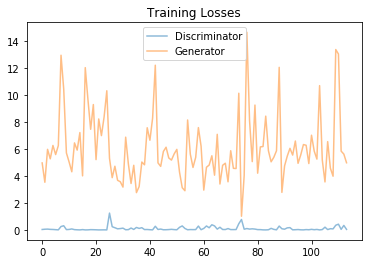

In [112]:
# fig, ax = plt.subplots()
# losses = np.array(losses)
# plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
# plt.plot(losses.T[1], label='Generator', alpha=0.5)
# plt.title("Training Losses")
# plt.legend()

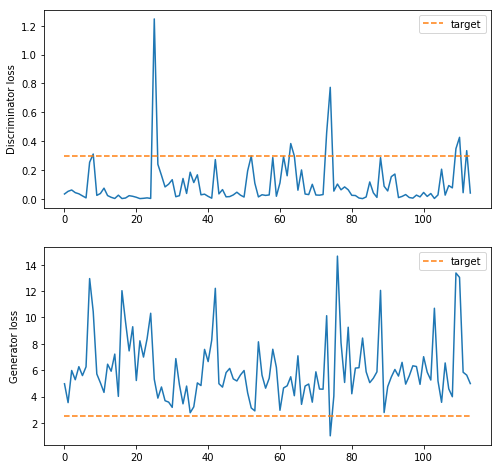

In [130]:
fig, axes = plt.subplots(2, 1, figsize=(8,8),)
ylabels = ['Discriminator loss', 'Generator loss']
targets = [0.3, 2.5]
for i, ax in zip([0, 1], axes.flatten()):
    ax.plot(losses.T[i])
    ax.plot([targets[i]] * len(losses.T[i]), label='target', linestyle='--')    
    ax.set_ylabel(ylabels[i])
    ax.legend()

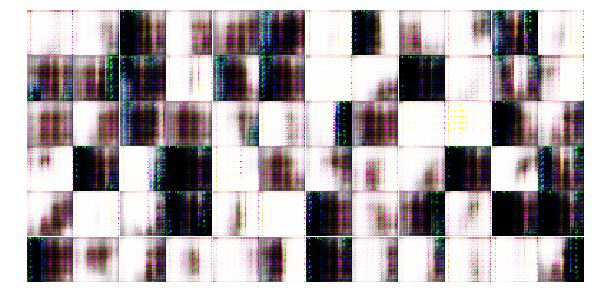

In [113]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

### Parameters 2: parameters in the DCGAN paper

Epoch 1/25... steps 10 Discriminator Loss: 1.0999... Generator Loss: 0.8742
Epoch 1/25... steps 20 Discriminator Loss: 0.5438... Generator Loss: 1.4337
Epoch 1/25... steps 30 Discriminator Loss: 0.1444... Generator Loss: 2.6262
Epoch 1/25... steps 40 Discriminator Loss: 0.1385... Generator Loss: 3.0038
Epoch 1/25... steps 50 Discriminator Loss: 0.2207... Generator Loss: 2.5742
Epoch 1/25... steps 60 Discriminator Loss: 0.1396... Generator Loss: 2.9238
Epoch 1/25... steps 70 Discriminator Loss: 0.2412... Generator Loss: 2.4591
Epoch 1/25... steps 80 Discriminator Loss: 0.1116... Generator Loss: 3.2918
Epoch 1/25... steps 90 Discriminator Loss: 0.1055... Generator Loss: 3.1738
Epoch 1/25... steps 100 Discriminator Loss: 1.8030... Generator Loss: 5.4249


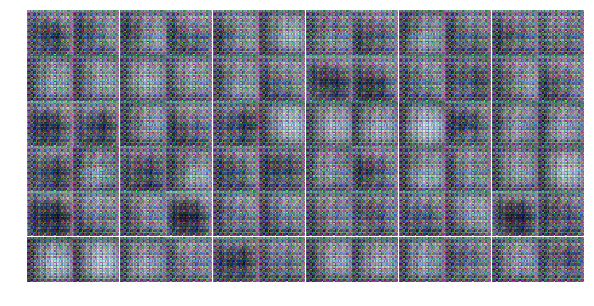

Epoch 1/25... steps 110 Discriminator Loss: 0.6347... Generator Loss: 1.6467
Epoch 1/25... steps 120 Discriminator Loss: 0.4424... Generator Loss: 1.9474
Epoch 1/25... steps 130 Discriminator Loss: 0.7892... Generator Loss: 0.8493
Epoch 1/25... steps 140 Discriminator Loss: 0.3828... Generator Loss: 2.0039
Epoch 1/25... steps 150 Discriminator Loss: 0.4284... Generator Loss: 2.2316
Epoch 1/25... steps 160 Discriminator Loss: 0.4358... Generator Loss: 1.9198
Epoch 1/25... steps 170 Discriminator Loss: 0.2520... Generator Loss: 2.5229
Epoch 1/25... steps 180 Discriminator Loss: 0.2726... Generator Loss: 3.3220
Epoch 1/25... steps 190 Discriminator Loss: 0.7714... Generator Loss: 4.6338
Epoch 1/25... steps 200 Discriminator Loss: 0.4378... Generator Loss: 2.0630


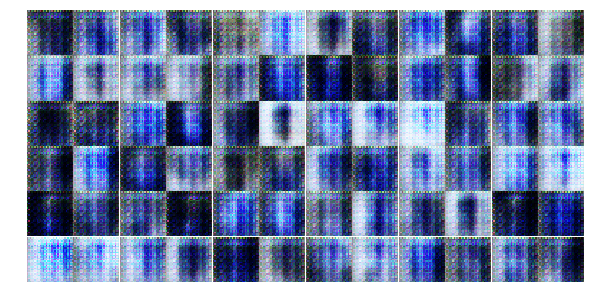

Epoch 1/25... steps 210 Discriminator Loss: 0.3300... Generator Loss: 2.7705
Epoch 1/25... steps 220 Discriminator Loss: 0.3712... Generator Loss: 5.5542
Epoch 1/25... steps 230 Discriminator Loss: 1.0384... Generator Loss: 1.4580
Epoch 1/25... steps 240 Discriminator Loss: 0.8554... Generator Loss: 1.0342
Epoch 1/25... steps 250 Discriminator Loss: 0.4843... Generator Loss: 2.9560
Epoch 1/25... steps 260 Discriminator Loss: 1.4290... Generator Loss: 0.8790
Epoch 1/25... steps 270 Discriminator Loss: 1.1740... Generator Loss: 1.1858
Epoch 1/25... steps 280 Discriminator Loss: 1.3165... Generator Loss: 0.6913
Epoch 1/25... steps 290 Discriminator Loss: 0.8051... Generator Loss: 0.9950
Epoch 1/25... steps 300 Discriminator Loss: 0.6866... Generator Loss: 1.2435


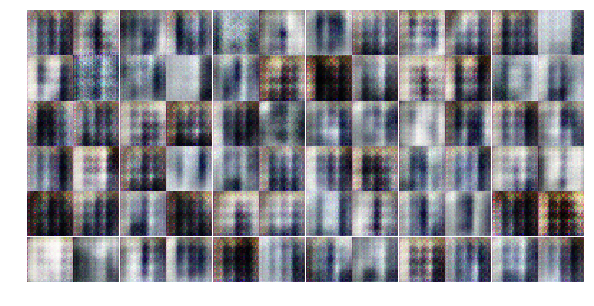

Epoch 1/25... steps 310 Discriminator Loss: 0.6439... Generator Loss: 1.2142
Epoch 1/25... steps 320 Discriminator Loss: 0.8769... Generator Loss: 0.8203
Epoch 1/25... steps 330 Discriminator Loss: 1.1098... Generator Loss: 1.0169
Epoch 1/25... steps 340 Discriminator Loss: 0.7519... Generator Loss: 1.4217
Epoch 1/25... steps 350 Discriminator Loss: 0.5401... Generator Loss: 1.3360
Epoch 1/25... steps 360 Discriminator Loss: 1.3145... Generator Loss: 0.4779
Epoch 1/25... steps 370 Discriminator Loss: 0.7047... Generator Loss: 1.3602
Epoch 1/25... steps 380 Discriminator Loss: 0.7311... Generator Loss: 2.2950
Epoch 1/25... steps 390 Discriminator Loss: 0.7132... Generator Loss: 1.6735
Epoch 1/25... steps 400 Discriminator Loss: 0.5561... Generator Loss: 1.4461


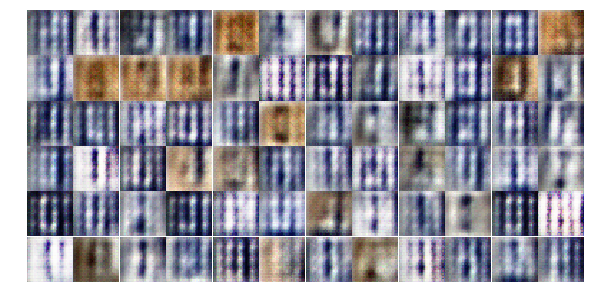

Epoch 1/25... steps 410 Discriminator Loss: 0.8815... Generator Loss: 0.9546
Epoch 1/25... steps 420 Discriminator Loss: 0.6292... Generator Loss: 1.5634
Epoch 1/25... steps 430 Discriminator Loss: 0.9987... Generator Loss: 2.1895
Epoch 1/25... steps 440 Discriminator Loss: 1.6196... Generator Loss: 0.3708
Epoch 1/25... steps 450 Discriminator Loss: 0.5524... Generator Loss: 1.4385
Epoch 1/25... steps 460 Discriminator Loss: 0.7351... Generator Loss: 1.8934
Epoch 1/25... steps 470 Discriminator Loss: 0.6300... Generator Loss: 1.6540
Epoch 1/25... steps 480 Discriminator Loss: 0.8285... Generator Loss: 0.9818
Epoch 1/25... steps 490 Discriminator Loss: 0.5616... Generator Loss: 1.1985
Epoch 1/25... steps 500 Discriminator Loss: 0.5136... Generator Loss: 1.8408


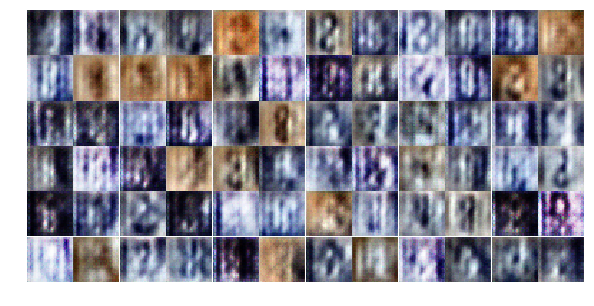

Epoch 1/25... steps 510 Discriminator Loss: 0.7509... Generator Loss: 1.6354
Epoch 1/25... steps 520 Discriminator Loss: 0.5333... Generator Loss: 2.1700
Epoch 1/25... steps 530 Discriminator Loss: 0.9713... Generator Loss: 1.7454
Epoch 1/25... steps 540 Discriminator Loss: 1.4302... Generator Loss: 0.5249
Epoch 1/25... steps 550 Discriminator Loss: 0.9800... Generator Loss: 1.1328
Epoch 1/25... steps 560 Discriminator Loss: 1.0305... Generator Loss: 0.6981
Epoch 1/25... steps 570 Discriminator Loss: 0.9540... Generator Loss: 1.4656
Epoch 2/25... steps 580 Discriminator Loss: 1.0142... Generator Loss: 1.3724
Epoch 2/25... steps 590 Discriminator Loss: 0.8014... Generator Loss: 1.6103
Epoch 2/25... steps 600 Discriminator Loss: 1.0444... Generator Loss: 0.9439


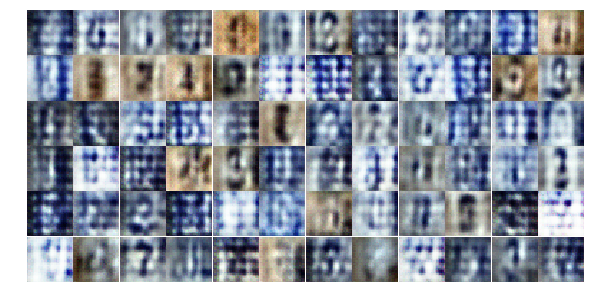

Epoch 2/25... steps 610 Discriminator Loss: 1.1224... Generator Loss: 0.9903
Epoch 2/25... steps 620 Discriminator Loss: 1.7551... Generator Loss: 0.3614
Epoch 2/25... steps 630 Discriminator Loss: 1.5224... Generator Loss: 0.6658
Epoch 2/25... steps 640 Discriminator Loss: 1.0684... Generator Loss: 1.1289
Epoch 2/25... steps 650 Discriminator Loss: 0.9653... Generator Loss: 0.8756
Epoch 2/25... steps 660 Discriminator Loss: 0.8039... Generator Loss: 1.3415
Epoch 2/25... steps 670 Discriminator Loss: 1.3278... Generator Loss: 0.7453
Epoch 2/25... steps 680 Discriminator Loss: 0.7505... Generator Loss: 1.2817
Epoch 2/25... steps 690 Discriminator Loss: 0.8813... Generator Loss: 0.9811
Epoch 2/25... steps 700 Discriminator Loss: 0.9659... Generator Loss: 1.1329


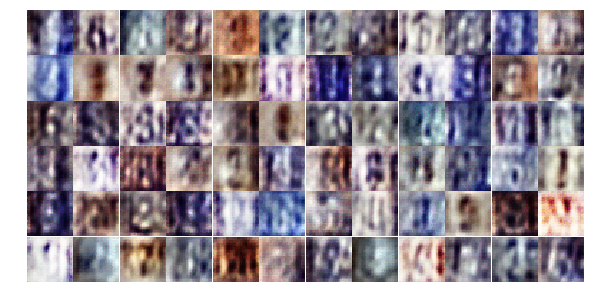

Epoch 2/25... steps 710 Discriminator Loss: 1.0035... Generator Loss: 0.9426
Epoch 2/25... steps 720 Discriminator Loss: 0.9785... Generator Loss: 1.3892
Epoch 2/25... steps 730 Discriminator Loss: 0.9415... Generator Loss: 1.2242
Epoch 2/25... steps 740 Discriminator Loss: 0.8644... Generator Loss: 1.2388
Epoch 2/25... steps 750 Discriminator Loss: 1.1518... Generator Loss: 1.1183
Epoch 2/25... steps 760 Discriminator Loss: 1.3883... Generator Loss: 0.5079
Epoch 2/25... steps 770 Discriminator Loss: 1.1995... Generator Loss: 0.5708
Epoch 2/25... steps 780 Discriminator Loss: 1.4589... Generator Loss: 0.4275
Epoch 2/25... steps 790 Discriminator Loss: 1.3234... Generator Loss: 0.6784
Epoch 2/25... steps 800 Discriminator Loss: 0.7406... Generator Loss: 1.1513


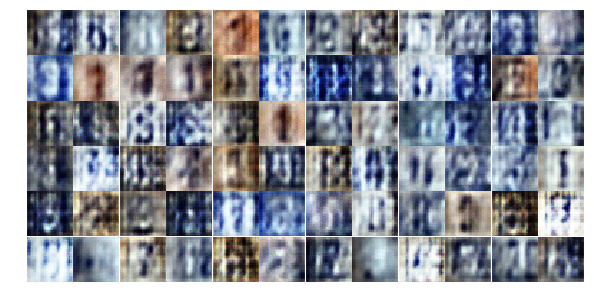

Epoch 2/25... steps 810 Discriminator Loss: 1.2035... Generator Loss: 1.1802
Epoch 2/25... steps 820 Discriminator Loss: 0.7213... Generator Loss: 1.4889
Epoch 2/25... steps 830 Discriminator Loss: 0.7036... Generator Loss: 1.1668
Epoch 2/25... steps 840 Discriminator Loss: 0.9658... Generator Loss: 0.9033
Epoch 2/25... steps 850 Discriminator Loss: 0.6521... Generator Loss: 1.3935
Epoch 2/25... steps 860 Discriminator Loss: 1.5819... Generator Loss: 0.3609
Epoch 2/25... steps 870 Discriminator Loss: 1.6576... Generator Loss: 0.5060
Epoch 2/25... steps 880 Discriminator Loss: 1.2227... Generator Loss: 0.9094
Epoch 2/25... steps 890 Discriminator Loss: 1.1856... Generator Loss: 0.8208
Epoch 2/25... steps 900 Discriminator Loss: 0.7881... Generator Loss: 1.5532


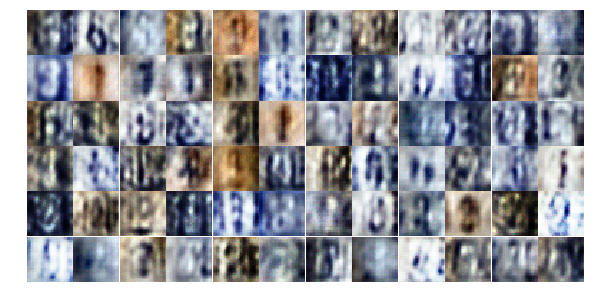

Epoch 2/25... steps 910 Discriminator Loss: 0.6823... Generator Loss: 1.8912
Epoch 2/25... steps 920 Discriminator Loss: 0.9734... Generator Loss: 0.7203
Epoch 2/25... steps 930 Discriminator Loss: 1.0276... Generator Loss: 0.7118
Epoch 2/25... steps 940 Discriminator Loss: 1.3846... Generator Loss: 0.4390
Epoch 2/25... steps 950 Discriminator Loss: 0.7511... Generator Loss: 1.7424
Epoch 2/25... steps 960 Discriminator Loss: 1.3982... Generator Loss: 2.5872
Epoch 2/25... steps 970 Discriminator Loss: 1.5166... Generator Loss: 2.6888
Epoch 2/25... steps 980 Discriminator Loss: 0.7069... Generator Loss: 1.5163
Epoch 2/25... steps 990 Discriminator Loss: 0.7197... Generator Loss: 1.9424
Epoch 2/25... steps 1000 Discriminator Loss: 1.2654... Generator Loss: 0.4575


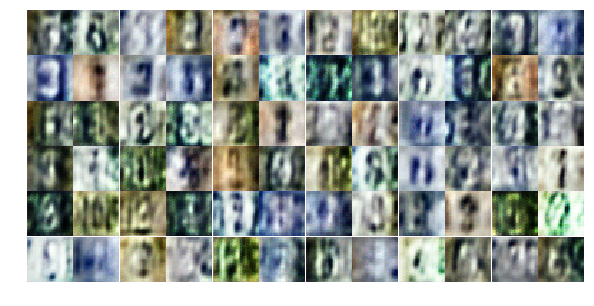

Epoch 2/25... steps 1010 Discriminator Loss: 0.7938... Generator Loss: 0.9104
Epoch 2/25... steps 1020 Discriminator Loss: 0.9206... Generator Loss: 0.8076
Epoch 2/25... steps 1030 Discriminator Loss: 0.7468... Generator Loss: 2.0901
Epoch 2/25... steps 1040 Discriminator Loss: 0.7132... Generator Loss: 1.7039
Epoch 2/25... steps 1050 Discriminator Loss: 0.5507... Generator Loss: 1.6474
Epoch 2/25... steps 1060 Discriminator Loss: 0.7424... Generator Loss: 1.0979
Epoch 2/25... steps 1070 Discriminator Loss: 1.7287... Generator Loss: 2.2844
Epoch 2/25... steps 1080 Discriminator Loss: 0.6979... Generator Loss: 2.2038
Epoch 2/25... steps 1090 Discriminator Loss: 0.5571... Generator Loss: 1.6484
Epoch 2/25... steps 1100 Discriminator Loss: 0.8854... Generator Loss: 0.7972


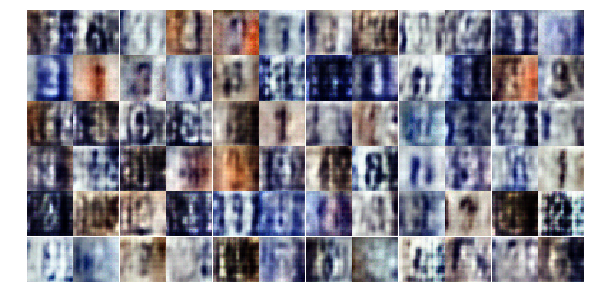

Epoch 2/25... steps 1110 Discriminator Loss: 0.6301... Generator Loss: 1.1857
Epoch 2/25... steps 1120 Discriminator Loss: 0.8051... Generator Loss: 0.9530
Epoch 2/25... steps 1130 Discriminator Loss: 1.1660... Generator Loss: 0.5335
Epoch 2/25... steps 1140 Discriminator Loss: 0.4649... Generator Loss: 1.5826
Epoch 3/25... steps 1150 Discriminator Loss: 0.2846... Generator Loss: 2.8572
Epoch 3/25... steps 1160 Discriminator Loss: 1.5243... Generator Loss: 0.3839
Epoch 3/25... steps 1170 Discriminator Loss: 0.5640... Generator Loss: 1.6581
Epoch 3/25... steps 1180 Discriminator Loss: 0.5550... Generator Loss: 1.8393
Epoch 3/25... steps 1190 Discriminator Loss: 1.5183... Generator Loss: 0.8388
Epoch 3/25... steps 1200 Discriminator Loss: 0.6346... Generator Loss: 1.6038


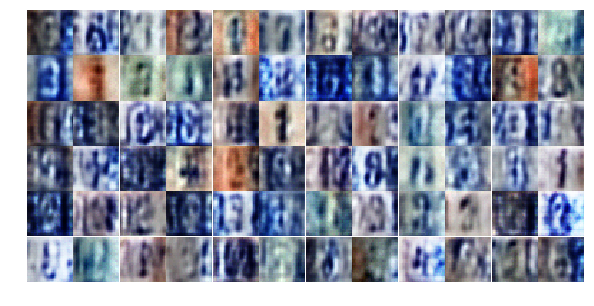

Epoch 3/25... steps 1210 Discriminator Loss: 0.5407... Generator Loss: 2.6583
Epoch 3/25... steps 1220 Discriminator Loss: 1.9833... Generator Loss: 0.1993
Epoch 3/25... steps 1230 Discriminator Loss: 0.7389... Generator Loss: 1.4128
Epoch 3/25... steps 1240 Discriminator Loss: 0.6498... Generator Loss: 1.6794
Epoch 3/25... steps 1250 Discriminator Loss: 0.7043... Generator Loss: 2.0637
Epoch 3/25... steps 1260 Discriminator Loss: 0.7025... Generator Loss: 1.1237
Epoch 3/25... steps 1270 Discriminator Loss: 0.4571... Generator Loss: 1.5412
Epoch 3/25... steps 1280 Discriminator Loss: 0.3171... Generator Loss: 1.9346
Epoch 3/25... steps 1290 Discriminator Loss: 1.3363... Generator Loss: 0.4263
Epoch 3/25... steps 1300 Discriminator Loss: 0.4730... Generator Loss: 1.9629


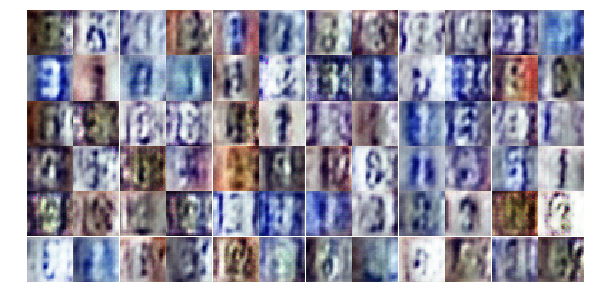

Epoch 3/25... steps 1310 Discriminator Loss: 1.3378... Generator Loss: 0.6175
Epoch 3/25... steps 1320 Discriminator Loss: 0.9345... Generator Loss: 0.7650
Epoch 3/25... steps 1330 Discriminator Loss: 0.5169... Generator Loss: 2.1727
Epoch 3/25... steps 1340 Discriminator Loss: 0.7304... Generator Loss: 1.1120
Epoch 3/25... steps 1350 Discriminator Loss: 0.5873... Generator Loss: 3.4018
Epoch 3/25... steps 1360 Discriminator Loss: 0.5530... Generator Loss: 2.6891
Epoch 3/25... steps 1370 Discriminator Loss: 2.0131... Generator Loss: 0.1775
Epoch 3/25... steps 1380 Discriminator Loss: 0.9480... Generator Loss: 1.5209
Epoch 3/25... steps 1390 Discriminator Loss: 0.4293... Generator Loss: 2.2811
Epoch 3/25... steps 1400 Discriminator Loss: 1.0394... Generator Loss: 0.6495


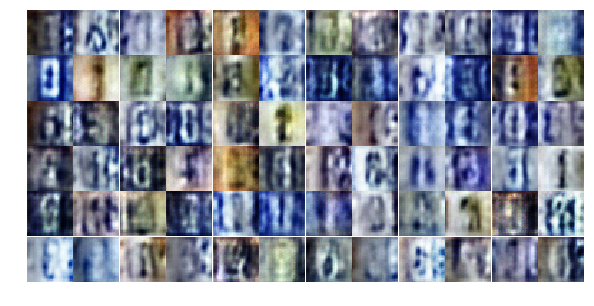

Epoch 3/25... steps 1410 Discriminator Loss: 0.7945... Generator Loss: 2.0197
Epoch 3/25... steps 1420 Discriminator Loss: 0.8063... Generator Loss: 1.3344
Epoch 3/25... steps 1430 Discriminator Loss: 0.5488... Generator Loss: 1.6092
Epoch 3/25... steps 1440 Discriminator Loss: 1.0537... Generator Loss: 0.6213
Epoch 3/25... steps 1450 Discriminator Loss: 1.2520... Generator Loss: 2.0663
Epoch 3/25... steps 1460 Discriminator Loss: 1.0000... Generator Loss: 0.7280
Epoch 3/25... steps 1470 Discriminator Loss: 0.7236... Generator Loss: 1.3106
Epoch 3/25... steps 1480 Discriminator Loss: 0.4516... Generator Loss: 2.6264
Epoch 3/25... steps 1490 Discriminator Loss: 0.4749... Generator Loss: 1.4829
Epoch 3/25... steps 1500 Discriminator Loss: 0.8139... Generator Loss: 2.3228


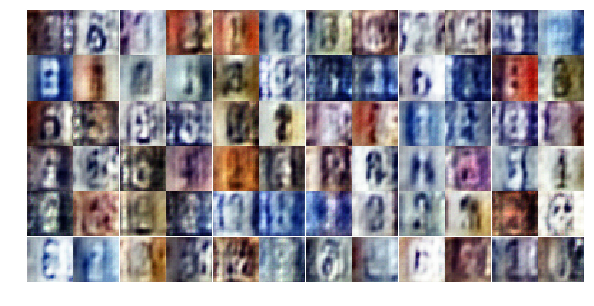

Epoch 3/25... steps 1510 Discriminator Loss: 0.2413... Generator Loss: 3.5020
Epoch 3/25... steps 1520 Discriminator Loss: 0.8077... Generator Loss: 1.1295
Epoch 3/25... steps 1530 Discriminator Loss: 0.2817... Generator Loss: 2.8608
Epoch 3/25... steps 1540 Discriminator Loss: 0.6138... Generator Loss: 2.2650
Epoch 3/25... steps 1550 Discriminator Loss: 0.2441... Generator Loss: 3.0305
Epoch 3/25... steps 1560 Discriminator Loss: 0.9410... Generator Loss: 3.8226
Epoch 3/25... steps 1570 Discriminator Loss: 1.0783... Generator Loss: 0.6167
Epoch 3/25... steps 1580 Discriminator Loss: 0.4881... Generator Loss: 1.4687
Epoch 3/25... steps 1590 Discriminator Loss: 0.8443... Generator Loss: 0.8316
Epoch 3/25... steps 1600 Discriminator Loss: 1.1709... Generator Loss: 0.5855


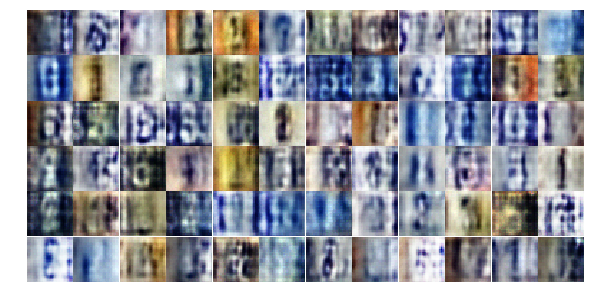

Epoch 3/25... steps 1610 Discriminator Loss: 0.4315... Generator Loss: 2.4455
Epoch 3/25... steps 1620 Discriminator Loss: 1.3383... Generator Loss: 3.1152
Epoch 3/25... steps 1630 Discriminator Loss: 0.5568... Generator Loss: 3.6145
Epoch 3/25... steps 1640 Discriminator Loss: 0.6715... Generator Loss: 1.5686
Epoch 3/25... steps 1650 Discriminator Loss: 0.7630... Generator Loss: 0.8585
Epoch 3/25... steps 1660 Discriminator Loss: 0.3768... Generator Loss: 3.2358
Epoch 3/25... steps 1670 Discriminator Loss: 0.2952... Generator Loss: 2.1216
Epoch 3/25... steps 1680 Discriminator Loss: 0.4070... Generator Loss: 1.4669
Epoch 3/25... steps 1690 Discriminator Loss: 0.8446... Generator Loss: 0.7900
Epoch 3/25... steps 1700 Discriminator Loss: 0.7041... Generator Loss: 1.7154


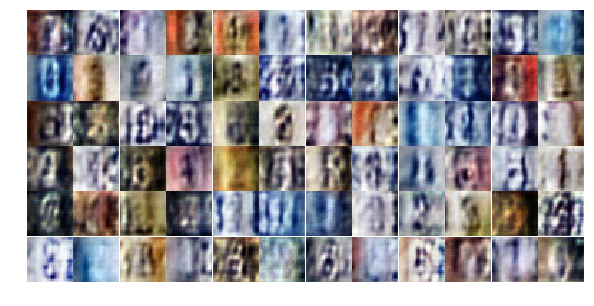

Epoch 3/25... steps 1710 Discriminator Loss: 0.9685... Generator Loss: 0.6683
Epoch 4/25... steps 1720 Discriminator Loss: 0.5329... Generator Loss: 2.1691
Epoch 4/25... steps 1730 Discriminator Loss: 0.4561... Generator Loss: 3.1724
Epoch 4/25... steps 1740 Discriminator Loss: 0.7784... Generator Loss: 2.7894
Epoch 4/25... steps 1750 Discriminator Loss: 0.4056... Generator Loss: 1.6786
Epoch 4/25... steps 1760 Discriminator Loss: 2.2771... Generator Loss: 3.7285
Epoch 4/25... steps 1770 Discriminator Loss: 0.9978... Generator Loss: 2.1058
Epoch 4/25... steps 1780 Discriminator Loss: 0.5624... Generator Loss: 3.0078
Epoch 4/25... steps 1790 Discriminator Loss: 0.3790... Generator Loss: 1.8678
Epoch 4/25... steps 1800 Discriminator Loss: 0.2922... Generator Loss: 2.2484


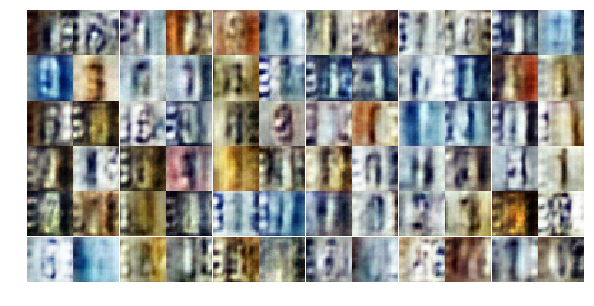

Epoch 4/25... steps 1810 Discriminator Loss: 0.4331... Generator Loss: 1.6449
Epoch 4/25... steps 1820 Discriminator Loss: 0.2134... Generator Loss: 3.4266
Epoch 4/25... steps 1830 Discriminator Loss: 0.8743... Generator Loss: 0.7918
Epoch 4/25... steps 1840 Discriminator Loss: 0.5257... Generator Loss: 2.6185
Epoch 4/25... steps 1850 Discriminator Loss: 1.1856... Generator Loss: 0.4966
Epoch 4/25... steps 1860 Discriminator Loss: 0.2213... Generator Loss: 2.2467
Epoch 4/25... steps 1870 Discriminator Loss: 1.4140... Generator Loss: 3.5922
Epoch 4/25... steps 1880 Discriminator Loss: 0.9161... Generator Loss: 0.8582
Epoch 4/25... steps 1890 Discriminator Loss: 0.4951... Generator Loss: 2.4513
Epoch 4/25... steps 1900 Discriminator Loss: 0.3806... Generator Loss: 1.6254


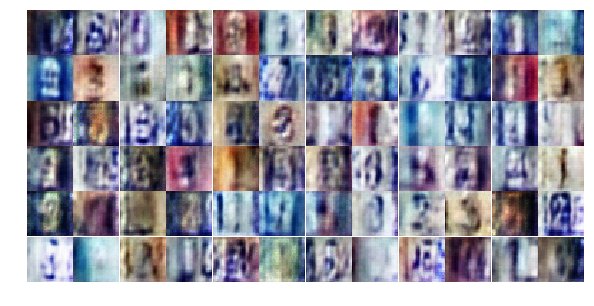

Epoch 4/25... steps 1910 Discriminator Loss: 0.3863... Generator Loss: 3.9048
Epoch 4/25... steps 1920 Discriminator Loss: 0.6689... Generator Loss: 1.1859
Epoch 4/25... steps 1930 Discriminator Loss: 0.4590... Generator Loss: 1.6466
Epoch 4/25... steps 1940 Discriminator Loss: 0.6240... Generator Loss: 1.1165
Epoch 4/25... steps 1950 Discriminator Loss: 0.5032... Generator Loss: 1.5672
Epoch 4/25... steps 1960 Discriminator Loss: 1.7080... Generator Loss: 4.6187
Epoch 4/25... steps 1970 Discriminator Loss: 2.2928... Generator Loss: 5.0538
Epoch 4/25... steps 1980 Discriminator Loss: 0.8029... Generator Loss: 0.9512
Epoch 4/25... steps 1990 Discriminator Loss: 0.5802... Generator Loss: 3.0752
Epoch 4/25... steps 2000 Discriminator Loss: 0.3692... Generator Loss: 3.9689


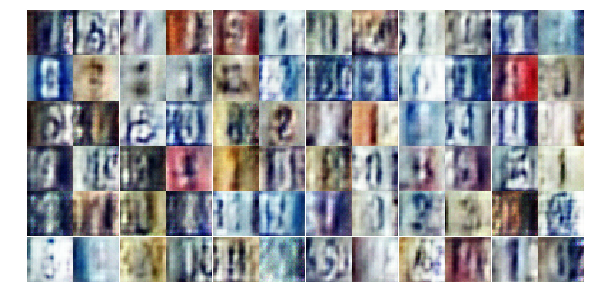

Epoch 4/25... steps 2010 Discriminator Loss: 0.8820... Generator Loss: 0.7094
Epoch 4/25... steps 2020 Discriminator Loss: 0.6168... Generator Loss: 2.3605
Epoch 4/25... steps 2030 Discriminator Loss: 0.4407... Generator Loss: 1.6163
Epoch 4/25... steps 2040 Discriminator Loss: 0.4499... Generator Loss: 1.3989
Epoch 4/25... steps 2050 Discriminator Loss: 0.2293... Generator Loss: 3.6526
Epoch 4/25... steps 2060 Discriminator Loss: 0.3427... Generator Loss: 1.9333
Epoch 4/25... steps 2070 Discriminator Loss: 1.2790... Generator Loss: 0.4963
Epoch 4/25... steps 2080 Discriminator Loss: 0.9053... Generator Loss: 0.6645
Epoch 4/25... steps 2090 Discriminator Loss: 0.8616... Generator Loss: 0.7381
Epoch 4/25... steps 2100 Discriminator Loss: 0.8541... Generator Loss: 0.8171


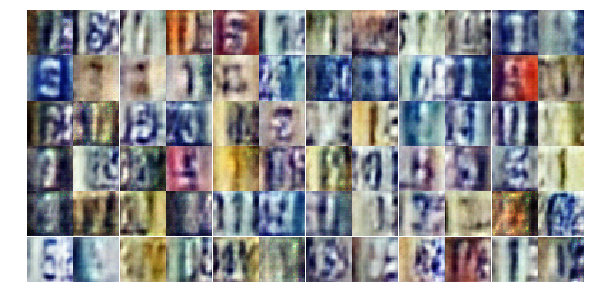

Epoch 4/25... steps 2110 Discriminator Loss: 0.9344... Generator Loss: 0.6949
Epoch 4/25... steps 2120 Discriminator Loss: 0.5102... Generator Loss: 1.2438
Epoch 4/25... steps 2130 Discriminator Loss: 0.4605... Generator Loss: 1.4708
Epoch 4/25... steps 2140 Discriminator Loss: 0.2918... Generator Loss: 2.0866
Epoch 4/25... steps 2150 Discriminator Loss: 0.1568... Generator Loss: 3.6255
Epoch 4/25... steps 2160 Discriminator Loss: 1.0960... Generator Loss: 5.4670
Epoch 4/25... steps 2170 Discriminator Loss: 0.5247... Generator Loss: 1.1570
Epoch 4/25... steps 2180 Discriminator Loss: 0.9064... Generator Loss: 0.7392
Epoch 4/25... steps 2190 Discriminator Loss: 0.8983... Generator Loss: 0.6388
Epoch 4/25... steps 2200 Discriminator Loss: 0.4581... Generator Loss: 1.7886


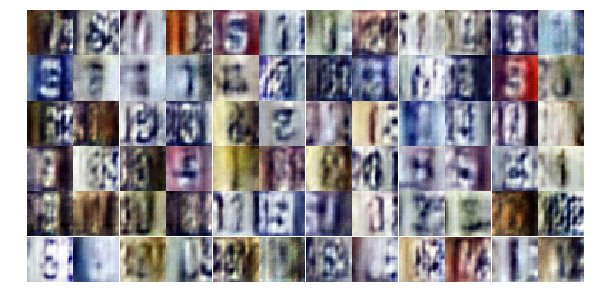

Epoch 4/25... steps 2210 Discriminator Loss: 0.3974... Generator Loss: 3.1626
Epoch 4/25... steps 2220 Discriminator Loss: 0.3816... Generator Loss: 3.4270
Epoch 4/25... steps 2230 Discriminator Loss: 0.6318... Generator Loss: 1.1181
Epoch 4/25... steps 2240 Discriminator Loss: 0.5113... Generator Loss: 1.2017
Epoch 4/25... steps 2250 Discriminator Loss: 0.9008... Generator Loss: 4.1842
Epoch 4/25... steps 2260 Discriminator Loss: 0.9415... Generator Loss: 3.9216
Epoch 4/25... steps 2270 Discriminator Loss: 0.1757... Generator Loss: 2.8315
Epoch 4/25... steps 2280 Discriminator Loss: 0.5372... Generator Loss: 1.2204
Epoch 4/25... steps 2290 Discriminator Loss: 0.6686... Generator Loss: 0.9705
Epoch 5/25... steps 2300 Discriminator Loss: 1.0240... Generator Loss: 0.5471


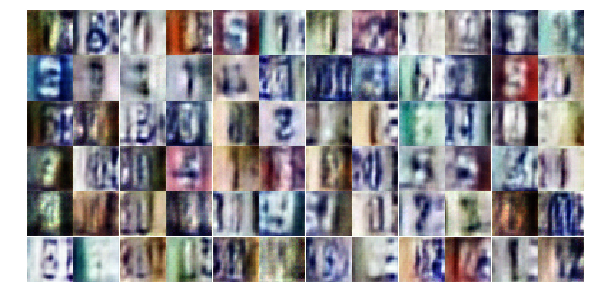

Epoch 5/25... steps 2310 Discriminator Loss: 0.3585... Generator Loss: 1.9556
Epoch 5/25... steps 2320 Discriminator Loss: 0.6962... Generator Loss: 0.8593
Epoch 5/25... steps 2330 Discriminator Loss: 0.3010... Generator Loss: 2.4069
Epoch 5/25... steps 2340 Discriminator Loss: 1.2925... Generator Loss: 0.6657
Epoch 5/25... steps 2350 Discriminator Loss: 0.2946... Generator Loss: 2.6906
Epoch 5/25... steps 2360 Discriminator Loss: 0.7398... Generator Loss: 0.8501
Epoch 5/25... steps 2370 Discriminator Loss: 0.3553... Generator Loss: 1.9141
Epoch 5/25... steps 2380 Discriminator Loss: 0.3336... Generator Loss: 1.7831
Epoch 5/25... steps 2390 Discriminator Loss: 0.5219... Generator Loss: 1.3793
Epoch 5/25... steps 2400 Discriminator Loss: 0.7535... Generator Loss: 0.8629


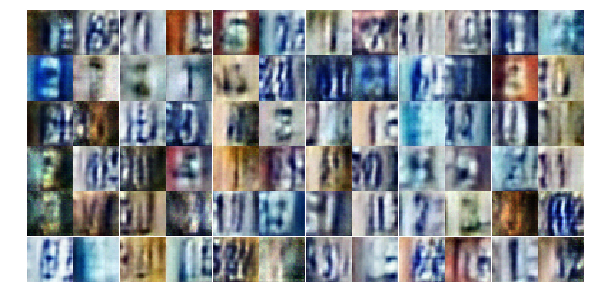

Epoch 5/25... steps 2410 Discriminator Loss: 0.2923... Generator Loss: 4.5766
Epoch 5/25... steps 2420 Discriminator Loss: 0.5372... Generator Loss: 1.2439
Epoch 5/25... steps 2430 Discriminator Loss: 0.3750... Generator Loss: 2.5378
Epoch 5/25... steps 2440 Discriminator Loss: 0.5008... Generator Loss: 1.1864
Epoch 5/25... steps 2450 Discriminator Loss: 1.5385... Generator Loss: 0.3264
Epoch 5/25... steps 2460 Discriminator Loss: 0.3183... Generator Loss: 1.8979
Epoch 5/25... steps 2470 Discriminator Loss: 0.3096... Generator Loss: 2.4497
Epoch 5/25... steps 2480 Discriminator Loss: 0.3767... Generator Loss: 1.6892
Epoch 5/25... steps 2490 Discriminator Loss: 0.3713... Generator Loss: 2.6781
Epoch 5/25... steps 2500 Discriminator Loss: 0.0713... Generator Loss: 4.6044


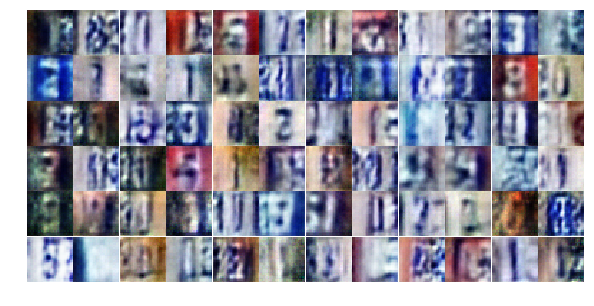

Epoch 5/25... steps 2510 Discriminator Loss: 0.1676... Generator Loss: 3.4995
Epoch 5/25... steps 2520 Discriminator Loss: 0.3904... Generator Loss: 4.3850
Epoch 5/25... steps 2530 Discriminator Loss: 0.1518... Generator Loss: 3.6812
Epoch 5/25... steps 2540 Discriminator Loss: 0.3184... Generator Loss: 1.9597
Epoch 5/25... steps 2550 Discriminator Loss: 1.2623... Generator Loss: 2.5929
Epoch 5/25... steps 2560 Discriminator Loss: 0.2692... Generator Loss: 2.4794
Epoch 5/25... steps 2570 Discriminator Loss: 0.7922... Generator Loss: 0.7849
Epoch 5/25... steps 2580 Discriminator Loss: 0.7180... Generator Loss: 1.0014
Epoch 5/25... steps 2590 Discriminator Loss: 0.2460... Generator Loss: 2.2133
Epoch 5/25... steps 2600 Discriminator Loss: 0.2020... Generator Loss: 2.7270


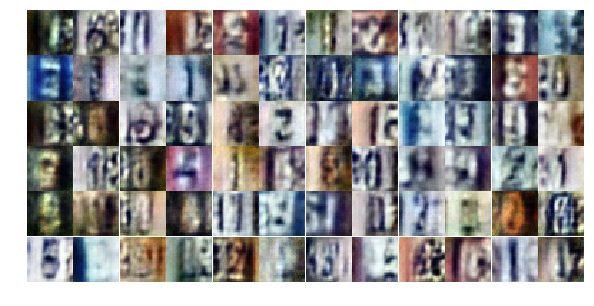

Epoch 5/25... steps 2610 Discriminator Loss: 0.7407... Generator Loss: 0.9126
Epoch 5/25... steps 2620 Discriminator Loss: 0.3535... Generator Loss: 1.5536
Epoch 5/25... steps 2630 Discriminator Loss: 0.4367... Generator Loss: 1.6119
Epoch 5/25... steps 2640 Discriminator Loss: 0.3164... Generator Loss: 1.8665
Epoch 5/25... steps 2650 Discriminator Loss: 0.3294... Generator Loss: 4.9735
Epoch 5/25... steps 2660 Discriminator Loss: 0.3736... Generator Loss: 4.2770
Epoch 5/25... steps 2670 Discriminator Loss: 0.8759... Generator Loss: 0.7981
Epoch 5/25... steps 2680 Discriminator Loss: 0.2469... Generator Loss: 2.8981
Epoch 5/25... steps 2690 Discriminator Loss: 0.6976... Generator Loss: 0.9327
Epoch 5/25... steps 2700 Discriminator Loss: 0.2305... Generator Loss: 3.0488


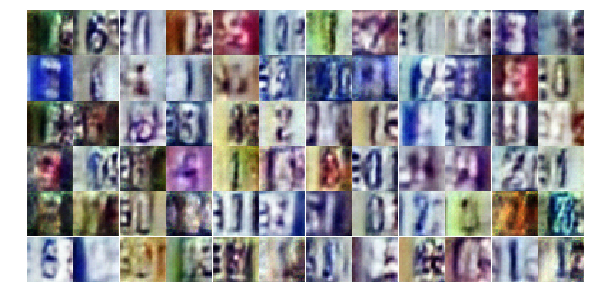

Epoch 5/25... steps 2710 Discriminator Loss: 0.1109... Generator Loss: 3.8370
Epoch 5/25... steps 2720 Discriminator Loss: 0.0835... Generator Loss: 4.0612
Epoch 5/25... steps 2730 Discriminator Loss: 0.6696... Generator Loss: 0.9598
Epoch 5/25... steps 2740 Discriminator Loss: 0.8378... Generator Loss: 1.5991
Epoch 5/25... steps 2750 Discriminator Loss: 0.8309... Generator Loss: 0.7806
Epoch 5/25... steps 2760 Discriminator Loss: 0.9327... Generator Loss: 1.8687
Epoch 5/25... steps 2770 Discriminator Loss: 0.5554... Generator Loss: 1.2779
Epoch 5/25... steps 2780 Discriminator Loss: 0.7383... Generator Loss: 1.3185
Epoch 5/25... steps 2790 Discriminator Loss: 0.4642... Generator Loss: 1.5231
Epoch 5/25... steps 2800 Discriminator Loss: 0.1818... Generator Loss: 2.8843


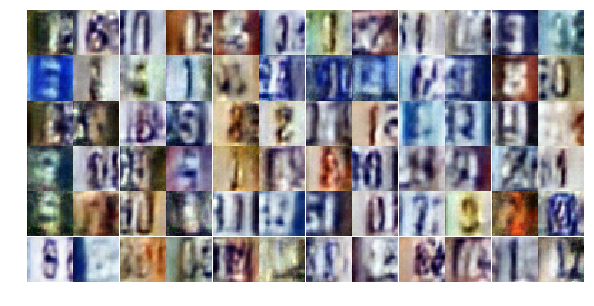

Epoch 5/25... steps 2810 Discriminator Loss: 1.1649... Generator Loss: 0.5424
Epoch 5/25... steps 2820 Discriminator Loss: 0.2405... Generator Loss: 3.8482
Epoch 5/25... steps 2830 Discriminator Loss: 0.2135... Generator Loss: 2.4547
Epoch 5/25... steps 2840 Discriminator Loss: 0.1968... Generator Loss: 2.6081
Epoch 5/25... steps 2850 Discriminator Loss: 1.1192... Generator Loss: 1.4934
Epoch 5/25... steps 2860 Discriminator Loss: 0.5776... Generator Loss: 1.4083
Epoch 6/25... steps 2870 Discriminator Loss: 0.4846... Generator Loss: 1.4471
Epoch 6/25... steps 2880 Discriminator Loss: 0.2989... Generator Loss: 1.8653
Epoch 6/25... steps 2890 Discriminator Loss: 0.1653... Generator Loss: 3.8330
Epoch 6/25... steps 2900 Discriminator Loss: 0.4876... Generator Loss: 1.4696


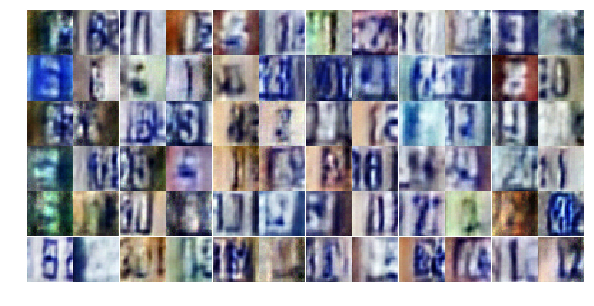

Epoch 6/25... steps 2910 Discriminator Loss: 0.4072... Generator Loss: 1.5028
Epoch 6/25... steps 2920 Discriminator Loss: 0.3395... Generator Loss: 2.1706
Epoch 6/25... steps 2930 Discriminator Loss: 0.2858... Generator Loss: 1.9279
Epoch 6/25... steps 2940 Discriminator Loss: 0.7781... Generator Loss: 3.0674
Epoch 6/25... steps 2950 Discriminator Loss: 0.3809... Generator Loss: 1.6004
Epoch 6/25... steps 2960 Discriminator Loss: 0.3681... Generator Loss: 1.5094
Epoch 6/25... steps 2970 Discriminator Loss: 0.2969... Generator Loss: 1.6789
Epoch 6/25... steps 2980 Discriminator Loss: 0.7154... Generator Loss: 0.8636
Epoch 6/25... steps 2990 Discriminator Loss: 0.2269... Generator Loss: 2.3980
Epoch 6/25... steps 3000 Discriminator Loss: 0.6063... Generator Loss: 1.1463


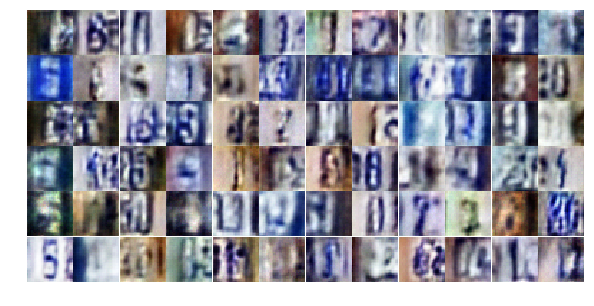

Epoch 6/25... steps 3010 Discriminator Loss: 0.8311... Generator Loss: 0.7343
Epoch 6/25... steps 3020 Discriminator Loss: 1.2972... Generator Loss: 0.4531
Epoch 6/25... steps 3030 Discriminator Loss: 0.4639... Generator Loss: 1.4149
Epoch 6/25... steps 3040 Discriminator Loss: 0.2736... Generator Loss: 1.7639
Epoch 6/25... steps 3050 Discriminator Loss: 0.2897... Generator Loss: 2.4750
Epoch 6/25... steps 3060 Discriminator Loss: 0.4433... Generator Loss: 1.4171
Epoch 6/25... steps 3070 Discriminator Loss: 0.4333... Generator Loss: 1.9182
Epoch 6/25... steps 3080 Discriminator Loss: 0.5094... Generator Loss: 1.2528
Epoch 6/25... steps 3090 Discriminator Loss: 0.8375... Generator Loss: 5.1153
Epoch 6/25... steps 3100 Discriminator Loss: 1.0848... Generator Loss: 0.5721


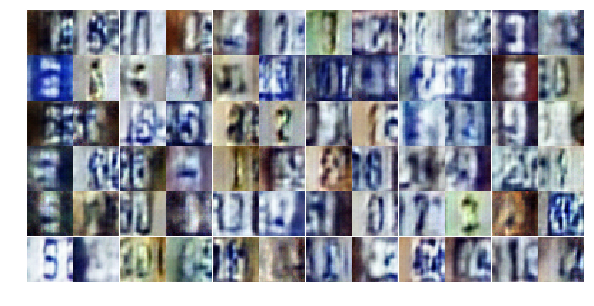

Epoch 6/25... steps 3110 Discriminator Loss: 0.6772... Generator Loss: 1.0527
Epoch 6/25... steps 3120 Discriminator Loss: 0.4989... Generator Loss: 2.0827
Epoch 6/25... steps 3130 Discriminator Loss: 0.3630... Generator Loss: 1.8581
Epoch 6/25... steps 3140 Discriminator Loss: 0.2121... Generator Loss: 2.4255
Epoch 6/25... steps 3150 Discriminator Loss: 0.3338... Generator Loss: 1.9175
Epoch 6/25... steps 3160 Discriminator Loss: 0.3641... Generator Loss: 2.5705
Epoch 6/25... steps 3170 Discriminator Loss: 0.1973... Generator Loss: 3.5735
Epoch 6/25... steps 3180 Discriminator Loss: 0.1053... Generator Loss: 3.3691
Epoch 6/25... steps 3190 Discriminator Loss: 0.4824... Generator Loss: 1.3830
Epoch 6/25... steps 3200 Discriminator Loss: 0.2873... Generator Loss: 4.3930


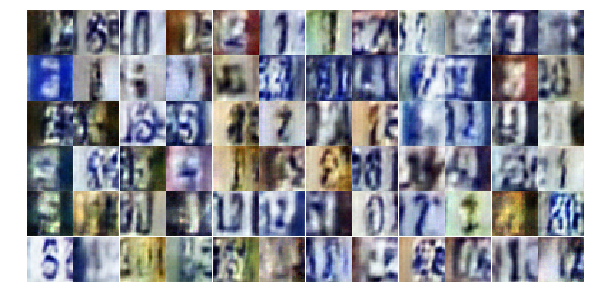

Epoch 6/25... steps 3210 Discriminator Loss: 0.9825... Generator Loss: 3.8064
Epoch 6/25... steps 3220 Discriminator Loss: 1.4739... Generator Loss: 4.9246
Epoch 6/25... steps 3230 Discriminator Loss: 0.4933... Generator Loss: 1.2178
Epoch 6/25... steps 3240 Discriminator Loss: 0.3042... Generator Loss: 2.6983
Epoch 6/25... steps 3250 Discriminator Loss: 0.5769... Generator Loss: 1.2008
Epoch 6/25... steps 3260 Discriminator Loss: 0.3356... Generator Loss: 2.5474
Epoch 6/25... steps 3270 Discriminator Loss: 0.2357... Generator Loss: 2.7345
Epoch 6/25... steps 3280 Discriminator Loss: 0.9055... Generator Loss: 3.2644
Epoch 6/25... steps 3290 Discriminator Loss: 0.2414... Generator Loss: 2.0788
Epoch 6/25... steps 3300 Discriminator Loss: 1.1851... Generator Loss: 0.5158


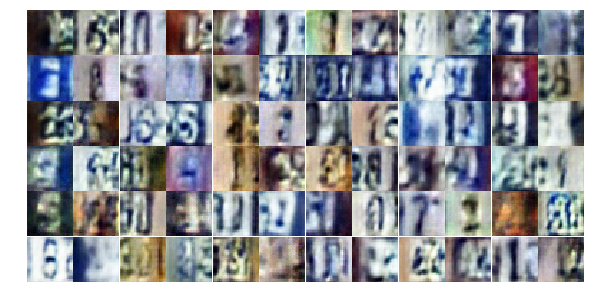

Epoch 6/25... steps 3310 Discriminator Loss: 0.6519... Generator Loss: 1.0245
Epoch 6/25... steps 3320 Discriminator Loss: 1.0932... Generator Loss: 4.0127
Epoch 6/25... steps 3330 Discriminator Loss: 0.5442... Generator Loss: 2.2443
Epoch 6/25... steps 3340 Discriminator Loss: 0.6382... Generator Loss: 1.3139
Epoch 6/25... steps 3350 Discriminator Loss: 0.2340... Generator Loss: 2.6649
Epoch 6/25... steps 3360 Discriminator Loss: 0.2009... Generator Loss: 2.4373
Epoch 6/25... steps 3370 Discriminator Loss: 0.1514... Generator Loss: 3.2863
Epoch 6/25... steps 3380 Discriminator Loss: 0.2392... Generator Loss: 2.2649
Epoch 6/25... steps 3390 Discriminator Loss: 0.1723... Generator Loss: 4.4164
Epoch 6/25... steps 3400 Discriminator Loss: 0.6058... Generator Loss: 1.1562


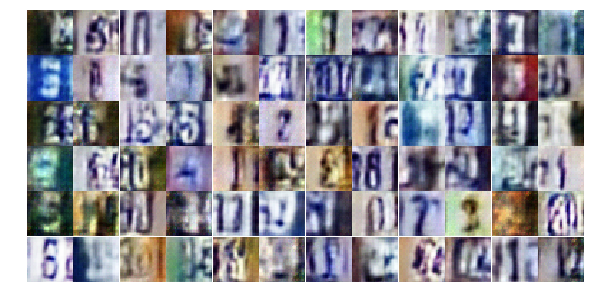

Epoch 6/25... steps 3410 Discriminator Loss: 0.2735... Generator Loss: 2.2337
Epoch 6/25... steps 3420 Discriminator Loss: 0.3215... Generator Loss: 1.7053
Epoch 6/25... steps 3430 Discriminator Loss: 0.9647... Generator Loss: 3.1056
Epoch 7/25... steps 3440 Discriminator Loss: 0.3496... Generator Loss: 4.7211
Epoch 7/25... steps 3450 Discriminator Loss: 0.3319... Generator Loss: 2.7303
Epoch 7/25... steps 3460 Discriminator Loss: 0.9260... Generator Loss: 3.0498


In [ ]:
# Solution:
real_size = (32,32,3)

z_size = 100

learning_rate = 0.0002

epochs = 25
batch_size = 128
alpha = 0.2
beta1 = 0.5



# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(8,8),)
ylabels = ['Discriminator loss', 'Generator loss']
targets = [0.3, 2.5]
for i, ax in zip([0, 1], axes.flatten()):
    ax.plot(losses.T[i])
    ax.plot([targets[i]] * len(losses.T[i]), label='target', linestyle='--')    
    ax.set_ylabel(ylabels[i])
    ax.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))